In [1]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from utils.data_processing import (
    load_dataset, 
    save_dataset,
    remove_duplicates_and_empty_rows,
    check_if_column_is_unique_per_row,
    predict_missing_values_with_linear_regression,
    get_outliers_IRQ,
    get_distinct_rows_from_dataframes,
    BRONZE_PATH,
    SILVER_PATH,
    GOLD_PATH,
    GROUP_FILENAME,
    POSTS_FILENAME
)
from utils.data_visualization import (
    analyse_categorical_features,
    analyse_numerical_features,
    analyse_numerical_features_per_category,
    plot_correlation_matrices,
    plot_scatter_graph,
    analyse_aggregated_features_per_category,
    analyse_features_trend
)

In [2]:
posts_df = load_dataset(SILVER_PATH + "posts_and_group", "parquet")

# Features Engineering:

In this section additional metrics based on preprocessed _silver_ data will be defined and analysed. Enriched dataset and used aggregated tables would be saved to _gold_ layer as data ready for predictive analysis.

Main purposes of new metrics are to mirrow and help to descide how to:
- Increase the overall `reach` of publications.
- Increase the overall `reactions` with publications.
- Increate total `share` of publications.

We will define the following additional metrics based on existing features:
1. **Post day of week:** find out whether `reach` to posts is affected by day of week, as user activity obviously may vary depending on it.
2. **Reach-to-Engagement Ratio:** measure of how "interesting" the post is and how actively users interact with it. It will help us to define categories, wich which users interacts the most as well as a general trend of user engagement.
3. **Post Interest Rate:** categorical interpretation of the feature above, where $<10 \%$, $<50\%$, $\geq 50\%$ _Reach-to-Engagement Ratio_ will define _low_, _medium_, and _high_ post interest respectively. 
4. **Qnique reaches:** if we count that each `share` of the post brought exactly one `reach`, this metric indicates how many users found this post by themselves. It could help us to define where it is necessary to produce more posts, and where to increase a number of users sharing this post.
5. **Reaction Percent:** percentage of reactions from total amount of reactions and likes. It would support increasing overall `reactions` by converting `likes` into them.

This notebook consists of the following parts:
1. Metrics creation.
2. Metrics dependency on `post_day_of_week`.
3. Metrics dependency on `post_interest_rate`.
4. Metrics dependency on `group_name`.
5. Metrics aggregated by `['post_date', 'post_type', 'post_interest_rate']`.
6. Correlation matricies for new features.
7. Recommendations to achieve target metrics increase.

## 1. Metrics creation:

Creating metrics for `posts_df`:

In [3]:
posts_df['post_day_of_week'] = posts_df["post_date"].dt.day_name()
posts_df['post_day_of_week'].describe()

count       20000
unique          7
top       Tuesday
freq         2897
Name: post_day_of_week, dtype: object

In [4]:
posts_df['engagement_to_reach'] = (
    (posts_df['likes'] + posts_df['comments'] + posts_df['share'] + posts_df['click'] + posts_df['reaction']) / posts_df["reach"]
)
posts_df['engagement_to_reach'].describe()

count    20000.000000
mean         0.570333
std          1.085069
min          0.000354
25%          0.138848
50%          0.223103
75%          0.517332
max         14.666667
Name: engagement_to_reach, dtype: float64

In [5]:
bins = [0, 0.1, 0.5, 100]
labels = ['low', 'medium', 'high']

posts_df['post_interest_rate'] = pd.cut(posts_df['engagement_to_reach'], bins=bins, labels=labels, right=False)
posts_df['post_interest_rate'].describe()

count      20000
unique         3
top       medium
freq       12405
Name: post_interest_rate, dtype: object

In [6]:
posts_df['unique_reach'] = (
    posts_df['reach'] - posts_df['share']
)

posts_df['unique_reach'].describe()

count     20000.000000
mean     104660.872600
std      239586.818792
min         -41.000000
25%         874.750000
50%        3812.000000
75%        8744.250000
max      999711.000000
Name: unique_reach, dtype: float64

In [7]:
posts_df['reaction_per_likes'] = (
    posts_df['reaction'] / (posts_df['reaction'] + posts_df['likes'])
)

posts_df['reaction_per_likes'].describe()

count    19997.000000
mean         0.547879
std          0.357434
min          0.000000
25%          0.205357
50%          0.600000
75%          0.890110
max          1.000000
Name: reaction_per_likes, dtype: float64

## 2. Metrics dependency on `post_day_of_week`:

### Aggregated graphichs:

Graphics displaying how total amount of `reach` and engagement metrics vary depending on the `post_day_of_the_week` aggregated and by `post_type`.

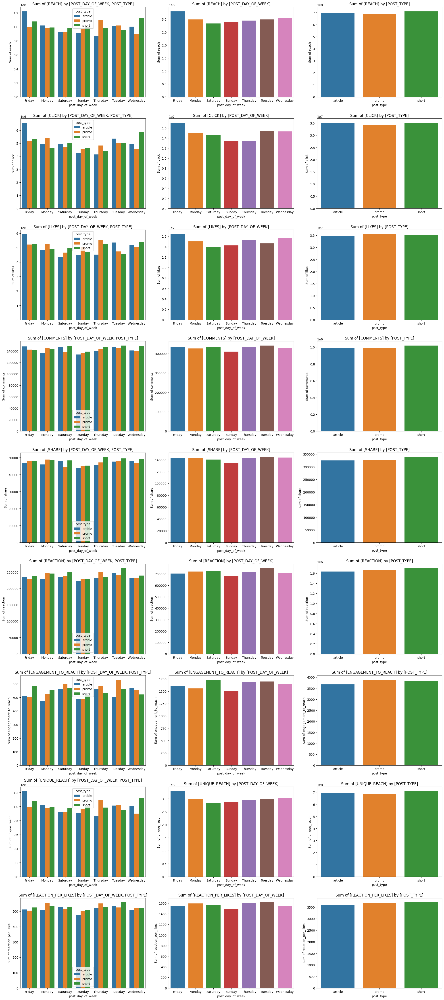

In [8]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['post_day_of_week', 'post_type'], ['post_day_of_week'], ['post_type']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'engagement_to_reach', 'unique_reach', 'reaction_per_likes']
)

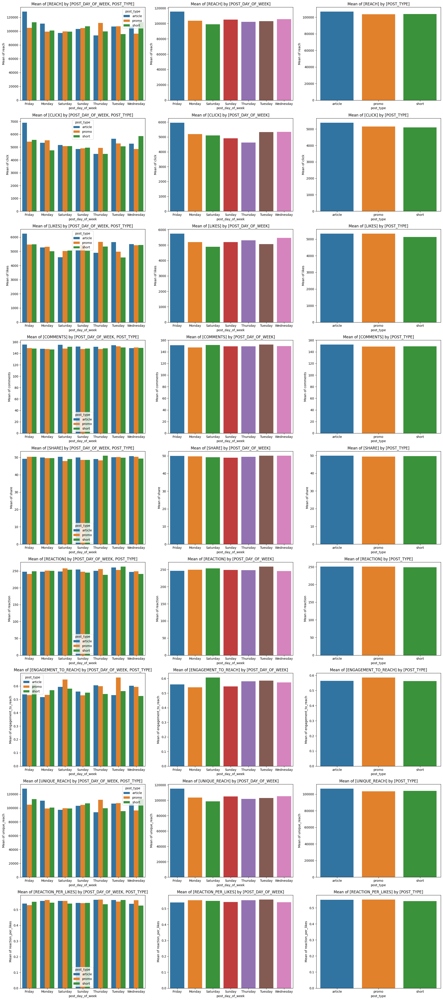

In [9]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['post_day_of_week', 'post_type'], ['post_day_of_week'], ['post_type']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'engagement_to_reach', 'unique_reach', 'reaction_per_likes'],
    agg_method='mean'
)

As we can see, for `post_type = 'article'` metrics `reach`, `click`, `likes`, `unique_reach` are higher than for other days.

In total average increase of this metric for this `post_type` on Fridays are:

In [10]:
target_metrics = ['reach', 'click', 'likes', 'unique_reach', 'reaction_per_likes']

df = posts_df[posts_df['post_type'] == 'article'][target_metrics + ['post_day_of_week']].groupby('post_day_of_week').mean()
df

,reach,click,likes,unique_reach,reaction_per_likes
post_day_of_week,,,,,
Friday,128233.847689,6909.323529,6249.949580,128184.686975,0.538041
Monday,110741.715217,5346.191304,5270.971739,110691.698913,0.555024
Saturday,97474.208421,5164.693684,4587.148421,97423.781053,0.555692
Sunday,103225.989773,4859.406818,5110.484091,103176.062500,0.542632
Thursday,93779.618378,4469.259459,4900.381622,93730.509189,0.562497
Tuesday,106647.986316,5646.474737,5655.397895,106597.854737,0.560562
Wednesday,106588.536093,5261.975584,5503.102972,106537.783439,0.536551


In [11]:
results = {}
for column in df.columns:
    results[column + '_percentage_less_than_FR'] = {}
    friday_value = df.loc['Friday', column]
    for i in range(1, len(df)):
        results[column + '_percentage_less_than_FR'][df.index[i]] = 100 - df.loc[df.index[i], column] / friday_value * 100
    results[column + '_percentage_less_than_FR']['Friday'] = 0.0

percentage_differ_per_day_of_week_df = pd.DataFrame(results)
percentage_differ_per_day_of_week_df.T

,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,Friday
reach_percentage_less_than_FR,13.640808,23.987145,19.501761,26.868280,16.833201,16.879562,0.0
click_percentage_less_than_FR,22.623520,25.250371,29.668848,35.315528,18.277459,23.842391,0.0
likes_percentage_less_than_FR,15.663772,26.605033,18.231595,21.593262,9.512904,11.949642,0.0
unique_reach_percentage_less_than_FR,13.646707,23.997333,19.509838,26.878544,16.840414,16.887277,0.0
reaction_per_likes_percentage_less_than_FR,-3.156461,-3.280548,-0.853165,-4.545295,-4.185649,0.276947,0.0


### Conclusion:

To sum up, we see that in general for articles metrics `['reach', 'click', 'likes', 'unique_reach']` on Friday are increasing from ~15% to ~25%. 

In this case a general proposal will be to increase a number of articles published on Fridays, since users are more engaged to click and like this content on the day mentioned. For the sake of resource saving, proposition would be to reschedule publishing of articles from other days of week to Friday.

## 3. Metrics dependency on `group_name`.

### Aggregated graphics:

Graphics for numerical features aggregated by `group_name`:

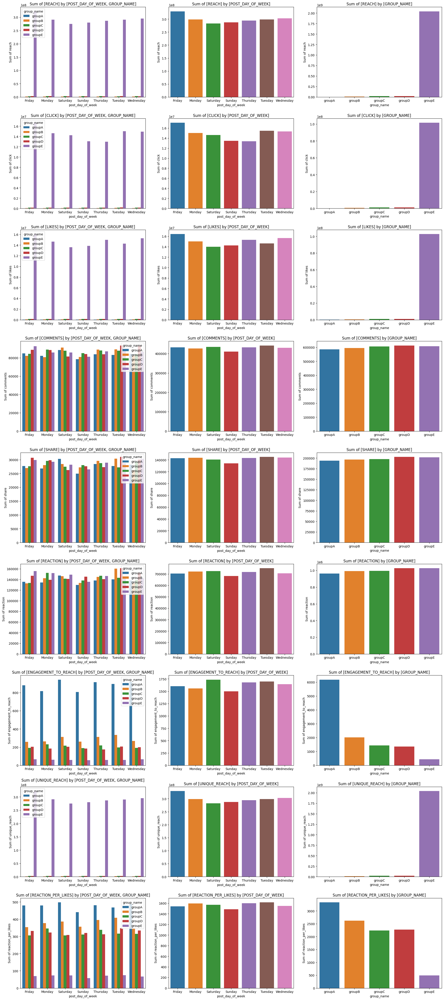

In [12]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['post_day_of_week', 'group_name'], ['post_day_of_week'], ['group_name']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'engagement_to_reach', 'unique_reach', 'reaction_per_likes']
)

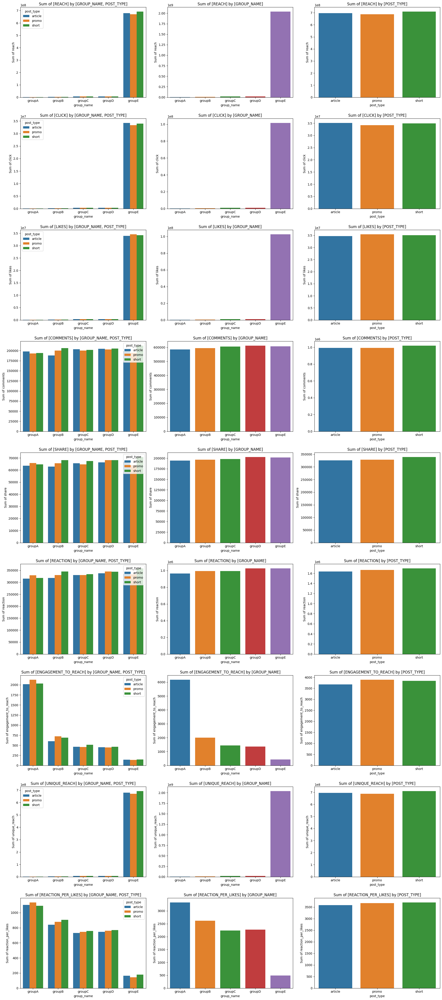

In [13]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['group_name', 'post_type'], ['group_name'], ['post_type']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'engagement_to_reach', 'unique_reach', 'reaction_per_likes']
)

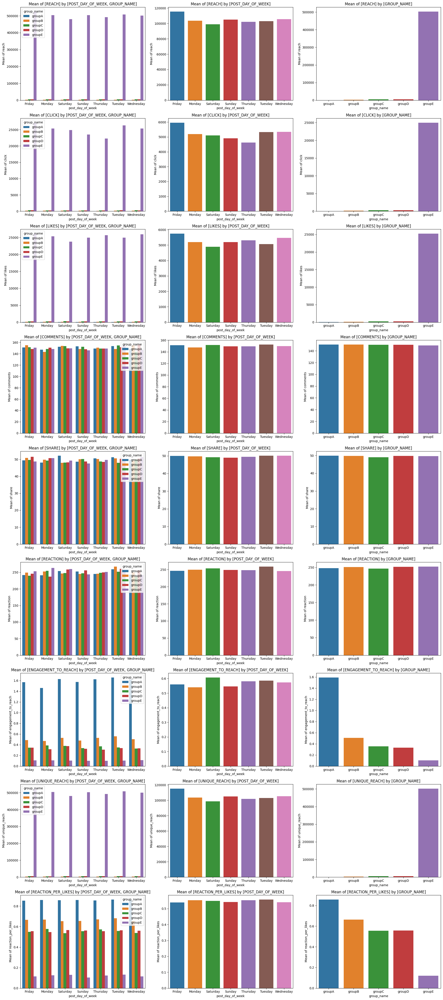

In [14]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['post_day_of_week', 'group_name'], ['post_day_of_week'], ['group_name']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'engagement_to_reach', 'unique_reach', 'reaction_per_likes'],
    agg_method='mean'
)

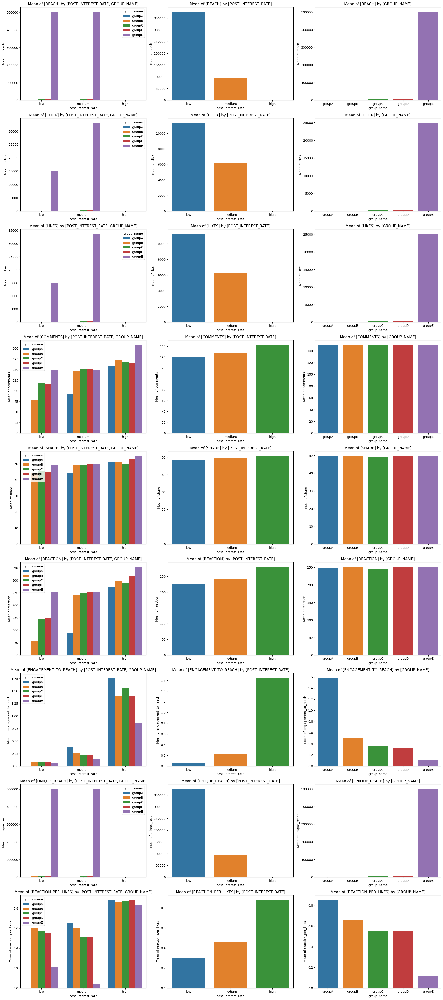

In [15]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['post_interest_rate', 'group_name'], ['post_interest_rate'], ['group_name']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'engagement_to_reach', 'unique_reach', 'reaction_per_likes'],
    agg_method='mean'
)

### Conclusion:

As one can see from graphs, `groupE` contains posts with lower activity and high `reach`, while `groupA` contains relatively "interesting posts". Other metrics does not differ much within `post_day_of_week` or `post_type`.

## 4. Metrics dependency on `post_interest_rate`:

### Aggregated graphics:

Graphics displaying how total amount of `reach` and engagement metrics vary depending on the `post_interest_rate` aggregated and by `post_type`.

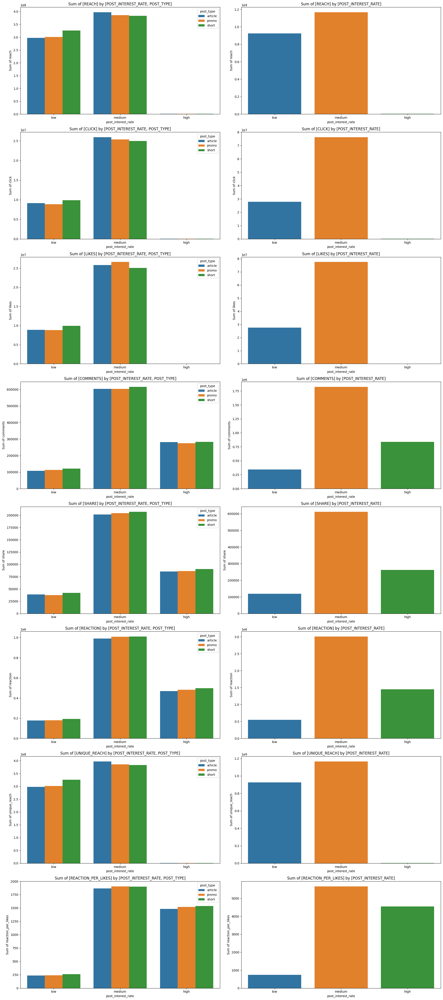

In [16]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['post_interest_rate', 'post_type'], ['post_interest_rate']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'unique_reach', 'reaction_per_likes'],
    agg_method='sum'
)

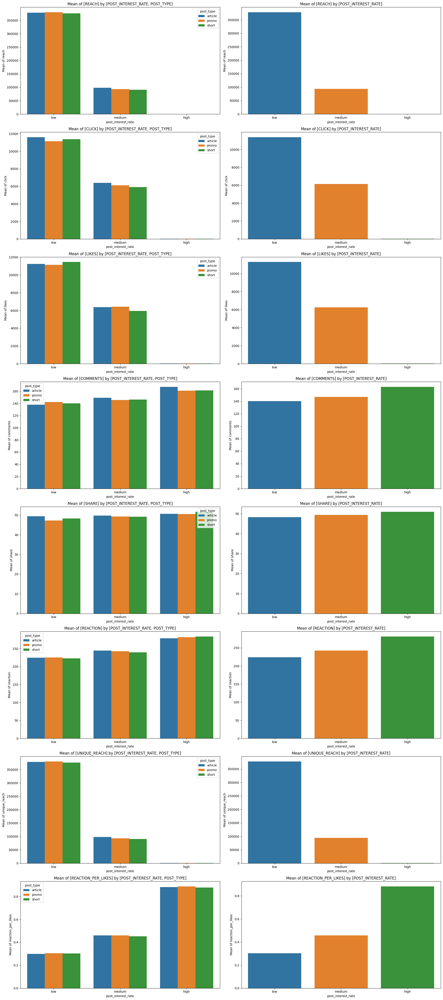

In [17]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['post_interest_rate', 'post_type'], ['post_interest_rate']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'unique_reach', 'reaction_per_likes'],
    agg_method='mean'
)

Graphics displaying how total amount of `reach` and engagement metrics vary depending on the `post_interest_rate` aggregated and by `post_day_of_week`.

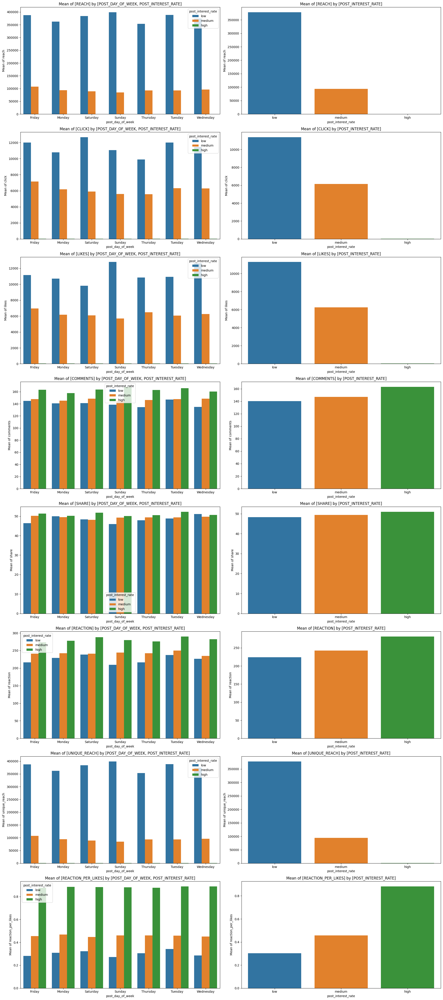

In [18]:
analyse_aggregated_features_per_category(
    posts_df, 
    agg_cols=[['post_day_of_week', 'post_interest_rate'], ['post_interest_rate']],
    metrics=['reach', 'click', 'likes', 'comments', 'share', 'reaction', 'unique_reach', 'reaction_per_likes'],
    agg_method='mean'
)

### Conclusion:

From the graphs above we can make the following conclusions:
- `share` and `comment` metrics are visible only for posts with extremely high popularity (any comment produces a reply).
- `unique_reach`, `reach`, `likes` metrics average for unpopular `post_type = 'article'` is relatively higher than for more popular posts. One can fairly suppose that articles are less resonant than popular posts of other types, however they "produce clicks" via click-beat titles and likes as a way of safe interesting material.
- Difference between post interest and other metrics does not vary a lot through the days of the week.
- `reaction` is high for medium posts. Popularity of `post_interest_rate = 'high'` are made through `comment` and `share`.
- `reaction_per_likes` is higher for popular posts.

General proposals for achieving defined goals are:
1. Add notes / mechanisms to engage people to read comments to the less popular posts and leave their own, since it is a great way to increase posts statistics whithout necessity to bring more unique viewers.

## 5. Metrics aggregated by `['post_date', 'post_type', 'post_interest_rate', 'group_name']`:

In futher prediction analysis it will be usefull to understand how posts metrics behave daily. Dataset was aggregated by all caterorical column for easier separation by `post_interest_rate` and `post_type`.

In [19]:
posts_df_aggregated = posts_df.groupby(['post_date', 'post_type', 'post_interest_rate']).agg(
    {
        'post_id' : 'count', 
        'group_name' : pd.Series.nunique, 
        'reach' : 'mean', 
        'click' : 'mean',
        'likes' : 'mean', 
        'comments' : 'mean', 
        'share' : 'mean', 
        'reaction' : 'mean', 
        'post_day_of_week' : 'first', 
        'engagement_to_reach' : 'mean', 
        'unique_reach' : 'mean',
        'reaction_per_likes': 'mean'
    }
).reset_index()
posts_df_aggregated.sort_values(by=['post_date', 'post_type', 'post_interest_rate'], inplace=True)

posts_df_aggregated

,post_date,post_type,post_interest_rate,post_id,group_name,reach,click,likes,comments,share,reaction,post_day_of_week,engagement_to_reach,unique_reach,reaction_per_likes
0,2024-01-01,article,low,14,3,249956.785714,9497.500000,10517.000000,113.571429,66.642857,211.428571,Monday,0.077796,249890.142857,0.321732
1,2024-01-01,article,medium,34,5,79251.147059,6177.147059,3610.147059,121.323529,52.823529,243.588235,Monday,0.233601,79198.323529,0.554115
2,2024-01-01,article,high,24,4,614.375000,32.791667,27.791667,188.750000,48.916667,278.875000,Monday,1.401049,565.458333,0.906512
3,2024-01-01,promo,low,8,2,505681.250000,15830.125000,16154.000000,117.750000,48.750000,179.250000,Monday,0.064381,505632.500000,0.321956
4,2024-01-01,promo,medium,55,5,116443.981818,7652.109091,7844.400000,141.236364,52.272727,259.436364,Monday,0.214602,116391.709091,0.462871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
814,2024-03-31,promo,medium,42,5,116122.047619,5725.952381,7278.619048,133.428571,46.476190,264.285714,Sunday,0.232919,116075.571429,0.490546
815,2024-03-31,promo,high,11,2,693.818182,41.818182,44.272727,151.272727,60.181818,259.000000,Sunday,0.871402,633.636364,0.817828
816,2024-03-31,short,low,7,3,309181.857143,17714.285714,1641.857143,150.285714,40.857143,209.000000,Sunday,0.065115,309141.000000,0.664852
817,2024-03-31,short,medium,47,5,56388.063830,4591.893617,3458.148936,129.574468,49.361702,232.680851,Sunday,0.230511,56338.702128,0.546269


### General statistics per date:

Let's look on the general trend for each existing feature grouping by `post_type, post_interest_rate`:

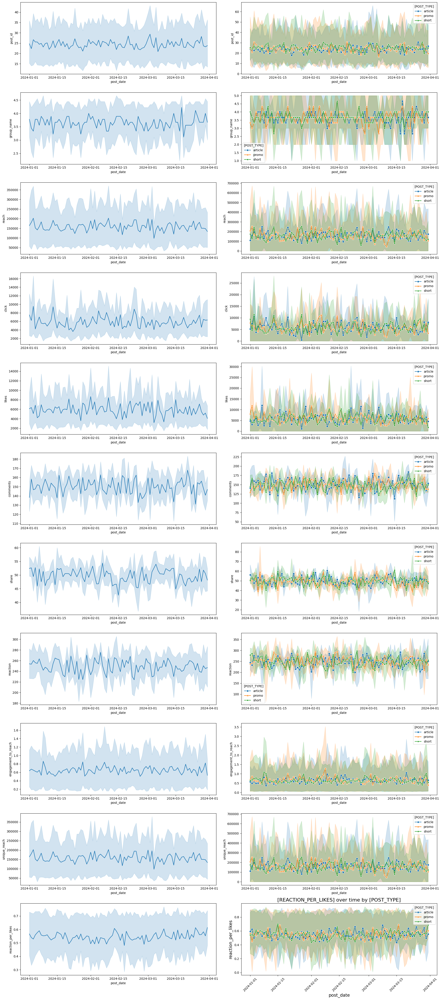

In [20]:
analyse_features_trend(posts_df_aggregated, 'post_date', 'post_type')

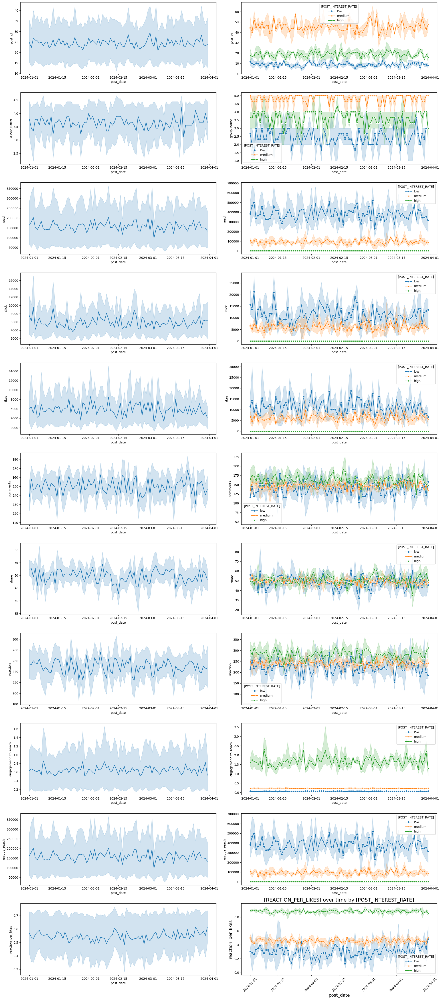

In [21]:
analyse_features_trend(posts_df_aggregated, 'post_date', 'post_interest_rate')

### Metrics creation:

The following metrics will be created to support futher predictive analysis:
1. **Reach Growth Rate:** tracking the growth rate of reach between posts can help identify what types of content or posting times might be contributing to increased visibility.
2. **Reaction Growth Rate:** tracking how reaction rate is changing over time.
3. **Share Growth Rate:** tracking how growth rate is chaing over time.

In [22]:
posts_df_aggregated['reach_growth_rate'] = posts_df_aggregated.groupby(['post_type', 'post_interest_rate'])['reach'].pct_change() * 100
posts_df_aggregated['reaction_growth_rate'] = posts_df_aggregated.groupby(['post_type', 'post_interest_rate'])['reaction'].pct_change() * 100
posts_df_aggregated['share_growth_rate'] = posts_df_aggregated.groupby(['post_type', 'post_interest_rate'])['share'].pct_change() * 100

### Growth rate analysis:

Visualizing is there any trend of growth for target metrics by `post_type` and by `post_interest_rate`:

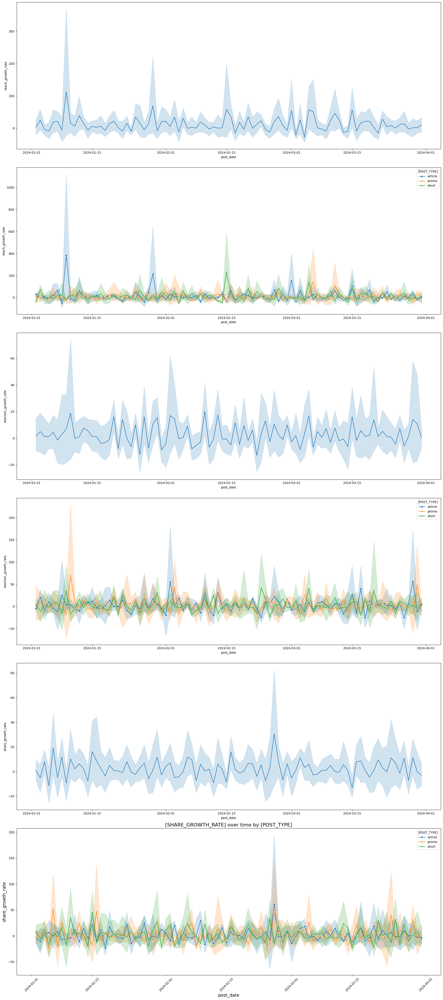

In [23]:
cols = ['post_date', 'post_type', 'post_interest_rate', 'reach_growth_rate', 'reaction_growth_rate', 'share_growth_rate']

analyse_features_trend(posts_df_aggregated[cols], 'post_date', 'post_type', in_one_row=True)

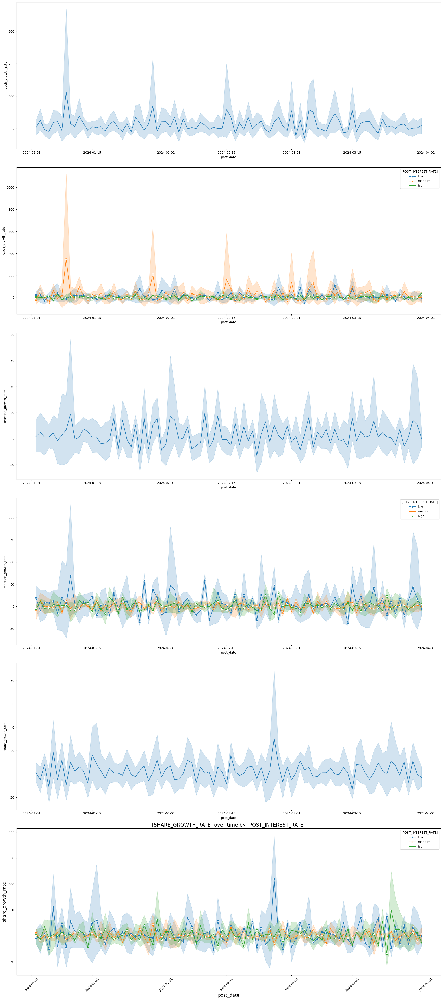

In [24]:
analyse_features_trend(posts_df_aggregated[cols], 'post_date', 'post_interest_rate', in_one_row=True)

### Conclusion:

From preformed analysis following conclusions could be made:
- Average values of numerical metrics per `post_type` and `post_interest_rate` have no tendency to increase (according to the statistics given for 3 month).
- For `post_type = 'article'` average sharing is constantly lower, than for other post types.
- Reactions growth rate per day varies more significantly than other metrics, moreover in average users tend to react on promos and shorts rather than articles. 

Therefore, to increase target metrics next steps should be applied:
1. Engage users to share and comment posts with low activity, as mainly because of these metrics posts convert to "highly interesting".
2. Add note / mechanism to engage users to reach on articles more. Since there is no aim to increase `likes`, we can suggest mechanism of converting `likes` to reachtions.

## 6. Correlation matricies for new features:

Correlation matricies for `posts_df` dataset:

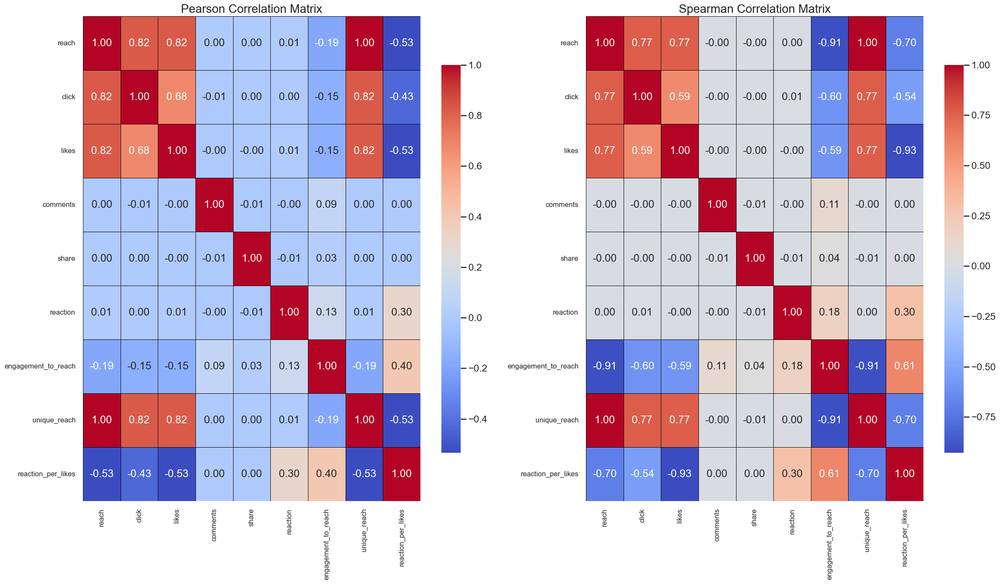

In [25]:
plot_correlation_matrices(posts_df, cols_to_remove=['post_id'])

Correlation matricies for aggregated dataset:

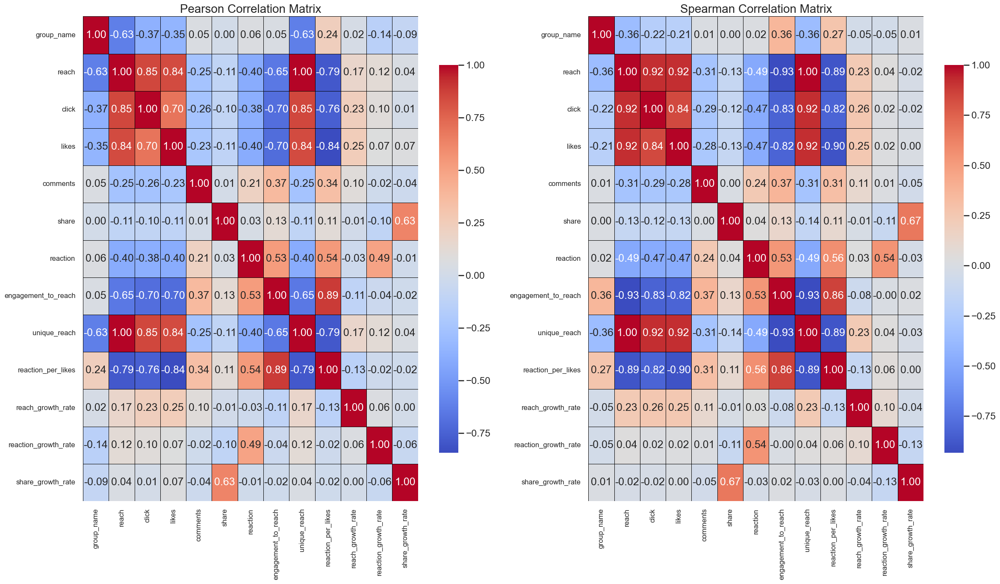

In [26]:
plot_correlation_matrices(posts_df_aggregated, cols_to_remove=['post_id'])

### Conclusion:

As it could be seen for aggregated statistics:
- `unique_reach` is highly correlated with `click` and `likes`.
- `reach_growth_rate` is sligtly affected with total average of `likes` and `click`.
- On the other hand, share and growth rates does not correlate with any other metrics.
- In total `reach`, `likes`, `click` averages are correlated with average `comments` number per date.

Therefore, correlations supports proposition about 

## 7. Recommendations to achieve target metrics increase:

In [27]:
save_dataset(posts_df, GOLD_PATH + "posts_and_group_df_with_new_metrics.parquet")
save_dataset(posts_df_aggregated, GOLD_PATH + "posts_and_group_df_with_new_metrics_agg_by_date.parquet")

posts_df = load_dataset(SILVER_PATH + "posts_and_group", "parquet")
posts_df['post_day_of_week'] = posts_df["post_date"].dt.day_name()

The following steps are proposed to be performed:
1. Increase a number of articles published on Fridays, since users are more engaged to click and like this content on the day mentioned. For the sake of resource saving, proposition would be to reschedule 10% of articles published from each other days of week to Friday.
2. To engage people to comment and produce a discussion under less popular posts and leave their own, we can add pre-generated comments for posts with low interest rate, but high reach.
4. Add mechanism to engage users to react on posts (especially articles) rather than liking them.

### Reschedule 10% of articles publishing to Friday:

Resheduling 10% of posts from other week days to Friday, and assuming that its statistics increases according defined `percentage_differ_per_day_of_week_df`.

In [28]:
percentage_differ_per_day_of_week_df = percentage_differ_per_day_of_week_df[[
    'reach_percentage_less_than_FR', 
    'click_percentage_less_than_FR', 
    'likes_percentage_less_than_FR'
]]

In [37]:
def to_closest_friday(date):
    weekday = date.weekday()
    if weekday <= 3:
        return date + pd.Timedelta(days=(4 - weekday))
    else:
        return date + pd.Timedelta(days=(11 - weekday))


def get_increase_percentage(day_of_week, metric):
    d = percentage_differ_per_day_of_week_df.to_dict()
    for k in d.keys():
        if metric in k:
            return d[k][day_of_week]


posts_df_fridays_articles_increasing = posts_df.copy()
sampled_indices = np.random.choice(
    posts_df_fridays_articles_increasing[posts_df_fridays_articles_increasing['post_day_of_week'] != 'Friday'].index, 
    size=int(len(posts_df_fridays_articles_increasing[posts_df_fridays_articles_increasing['post_day_of_week'] != 'Friday']) * 0.1), 
    replace=False
)

samples_to_modify = posts_df_fridays_articles_increasing.loc[sampled_indices]
samples_to_modify['post_date'] = samples_to_modify['post_date'].apply(to_closest_friday)

posts_df_fridays_articles_increasing.loc[sampled_indices, 'post_date'] = samples_to_modify['post_date']
posts_df_fridays_articles_increasing.loc[sampled_indices, 'post_day_of_week'] = ['Friday'] * len(sampled_indices) 

metrics = ['reach', 'likes', 'click']

for metric in metrics:
    samples_to_modify[metric] = (
        samples_to_modify[metric] * (samples_to_modify['post_day_of_week'].apply(lambda x: get_increase_percentage(x, metric)) / 100) + samples_to_modify[metric]
    )

    posts_df_fridays_articles_increasing.loc[sampled_indices, metric] = samples_to_modify[metric]

posts_df_fridays_articles_increasing

,post_id,group_name,post_date,post_type,reach,click,likes,comments,share,reaction,likes_predicted_w_lr,post_day_of_week,engagement_to_reach,post_interest_rate
0,1,groupE,2024-01-10,article,848706.000000,67896.000000,59409.000000,241,37,384,False,Wednesday,0.150326,medium
1,2,groupC,2024-02-06,short,7927.000000,476.000000,317.000000,284,72,16,False,Tuesday,0.144948,medium
2,3,groupC,2024-01-18,short,8326.000000,666.000000,167.000000,252,32,50,False,Thursday,0.134158,medium
3,4,groupD,2024-02-11,short,4039.000000,162.000000,40.000000,149,87,487,False,Sunday,0.108443,medium
4,5,groupE,2024-03-15,promo,580386.502541,49196.389906,16677.138187,57,7,271,False,Friday,0.110128,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19996,groupB,2024-01-01,article,844.000000,51.000000,68.000000,71,100,257,False,Monday,0.343602,medium
19996,19997,groupD,2024-01-14,short,4139.000000,331.000000,83.000000,275,70,295,False,Sunday,0.183378,medium
19997,19998,groupA,2024-01-15,article,457.000000,41.000000,18.000000,155,71,281,False,Monday,0.623632,high
19998,19999,groupC,2024-01-03,short,92.000000,6.000000,7.000000,156,40,379,False,Wednesday,2.271739,high


In [38]:
save_dataset(posts_df_fridays_articles_increasing, GOLD_PATH + "posts_with_rescheduled_articles_to_fr.parquet")

### Features improvement:

Let's look how total `reach` would be improved after:

In [46]:
posts_df['reach'].sum(), posts_df_fridays_articles_increasing['reach'].sum(), posts_df_fridays_articles_increasing['reach'].sum() / posts_df['reach'].sum() * 100

(2094210571, 2129183550.6664453, 101.66998391426061)

In [47]:
posts_df['reach'].mean(), posts_df_fridays_articles_increasing['reach'].mean(), posts_df_fridays_articles_increasing['reach'].mean() / posts_df['reach'].mean() * 100

(104710.52855, 106459.17753332226, 101.66998391426061)

Descriptive Statistics for reach:
count     20000.000000
mean     104710.528550
std      239586.822023
min          50.000000
25%         924.000000
50%        3864.000000
75%        8796.000000
max      999755.000000
Name: reach, dtype: float64




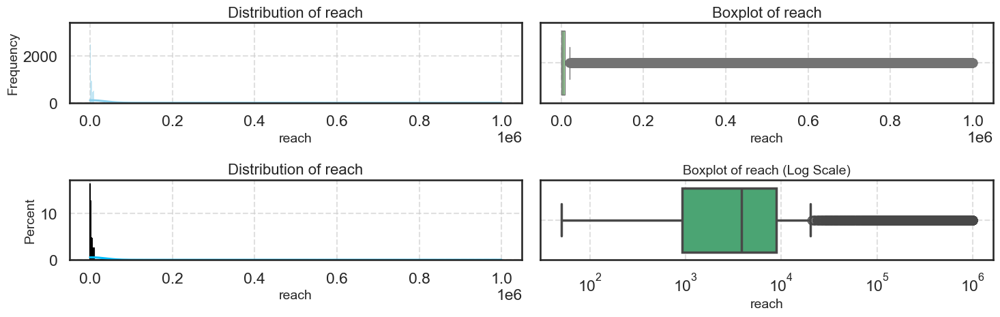

No missing values in reach.



In [43]:
analyse_numerical_features(pd.DataFrame(posts_df['reach']), cols_to_remove=[])

Descriptive Statistics for reach:
count    2.000000e+04
mean     1.064592e+05
std      2.440180e+05
min      5.000000e+01
25%      9.380000e+02
50%      3.906000e+03
75%      8.906500e+03
max      1.254439e+06
Name: reach, dtype: float64




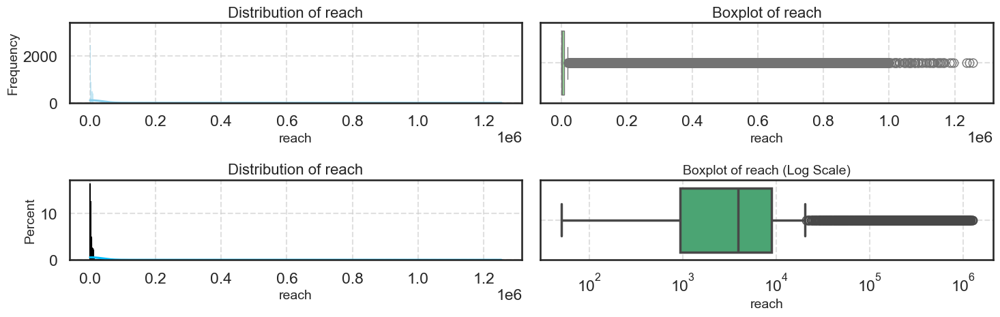

No missing values in reach.



In [44]:
analyse_numerical_features(pd.DataFrame(posts_df_fridays_articles_increasing['reach']), cols_to_remove=[])

### Adding pre-generated comments to less popular posts:

We will add pre-generated comments equals to 1% of `reach` to posts with low and medium rate of interest:

In [31]:
posts_df['engagement_to_reach'] = (
    (posts_df['likes'] + posts_df['comments'] + posts_df['share'] + posts_df['click']) / posts_df["reach"]
)

bins = [0, 0.1, 0.5, 100]
labels = ['low', 'medium', 'high']

posts_df['post_interest_rate'] = pd.cut(posts_df['engagement_to_reach'], bins=bins, labels=labels, right=False)

In [32]:
def add_comments(row):
    if row['post_interest_rate'] in ['low', 'medium']:
        return row['comments'] + np.ceil(0.01 * row['reach'])
    else:
        return row['comments']

posts_df_with_pregenerated_comments = posts_df.copy()
posts_df_with_pregenerated_comments['comments'] = posts_df.apply(add_comments, axis=1)
posts_df_with_pregenerated_comments.drop(columns=['post_interest_rate'], inplace=True)

posts_df_with_pregenerated_comments

,post_id,group_name,post_date,post_type,reach,click,likes,comments,share,reaction,likes_predicted_w_lr,post_day_of_week,engagement_to_reach
0,1,groupE,2024-01-10,article,848706,67896,59409,8729.0,37,384,False,Wednesday,0.150326
1,2,groupC,2024-02-06,short,7927,476,317,364.0,72,16,False,Tuesday,0.144948
2,3,groupC,2024-01-18,short,8326,666,167,336.0,32,50,False,Thursday,0.134158
3,4,groupD,2024-02-11,short,4039,162,40,190.0,87,487,False,Sunday,0.108443
4,5,groupE,2024-03-13,promo,496568,39725,14897,5023.0,7,271,False,Wednesday,0.110128
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19996,groupB,2024-01-01,article,844,51,68,80.0,100,257,False,Monday,0.343602
19996,19997,groupD,2024-01-14,short,4139,331,83,317.0,70,295,False,Sunday,0.183378
19997,19998,groupA,2024-01-15,article,457,41,18,155.0,71,281,False,Monday,0.623632
19998,19999,groupC,2024-01-03,short,92,6,7,156.0,40,379,False,Wednesday,2.271739


In [34]:
save_dataset(posts_df_with_pregenerated_comments, GOLD_PATH + "posts_with_pregenerated_comments_to_unpopular_posts.parquet")